# **Homework 6 - Generative Adversarial Network**

This is the example code of homework 6 of the machine learning course by Prof. Hung-yi Lee.


In this homework, you are required to build a generative adversarial  network for anime face generation.


## Set up the environment


### Packages Installation

In [ ]:
import torch
try:
    # Get GPU name, check if it's K80
    GPU_name = torch.cuda.get_device_name()
    if GPU_name[-3:] == "K80":
        print("Get K80! :'( RESTART!")
        exit()  # Restart the session
    else:
        print("Your GPU is {}!".format(GPU_name))
        print("Great! Keep going~")
except RuntimeError as e:
    if e.args == ("No CUDA GPUs are available",):
        print("You are training with CPU! "
              "Please restart!")
        exit()  # Restart the session
    else:
        print("What's wrong here?")
        print("Error message: \n", e)

Your GPU is Tesla T4!
Great! Keep going~


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# You may replace the workspace directory if you want.
workspace_dir = '.'

# Training progress bar
!pip install -q qqdm

### Download the dataset
**Please use the link according to the last digit of your student ID first!**

If all download links fail, please follow [here](https://drive.google.com/drive/folders/13T0Pa_WGgQxNkqZk781qhc5T9-zfh19e).

* To open the file using your browser, use the link below (replace the id first!):
https://drive.google.com/file/d/REPLACE_WITH_ID
* e.g. https://drive.google.com/file/d/1IGrTr308mGAaCKotpkkm8wTKlWs9Jq-p

In [ ]:
# !gdown --id 1IGrTr308mGAaCKotpkkm8wTKlWs9Jq-p --output "{workspace_dir}/crypko_data.zip"

# Other download links
#   Please uncomment the line according to the last digit of your student ID first

# 0
# !gdown --id 131zPaVoi-U--XThvzgRfaxrumc3YSBd3 --output "{workspace_dir}/crypko_data.zip"

# 1
# !gdown --id 1kCuIj1Pf3T2O94H9bUBxjPBKb---WOmH --output "{workspace_dir}/crypko_data.zip"

# 2
# !gdown --id 1boEoiiqBJwoHVvjmI0xgoutE9G0Rv8CD --output "{workspace_dir}/crypko_data.zip"

# 3
# !gdown --id 1Ic0mktAQQvnNAnswrPHsg-u2OWGBXTWF --output "{workspace_dir}/crypko_data.zip"

# 4
# !gdown --id 1PFcc25r9tLE7OyQ-CDadtysNdWizk6Yg --output "{workspace_dir}/crypko_data.zip"

# 5
# !gdown --id 1wgkrYkTrhwDSMdWa5NwpXeE4-7JaUuX2 --output "{workspace_dir}/crypko_data.zip"

# 6
# !gdown --id 19gwNYWi9gN9xVL86jC3v8qqNtrXyq5Bf --output "{workspace_dir}/crypko_data.zip"

# 7 
# !gdown --id 1-KPZB6frRSRLRAtQfafKCVA7em0_NrJG --output "{workspace_dir}/crypko_data.zip"

# 8
# !gdown --id 1rNBfmn0YBzXuG5ub7CXbsGwduZqEs8hx --output "{workspace_dir}/crypko_data.zip"

# 9
# !gdown --id 113NEISX-2j6rBd1yyBx0c3_9nPIzSNz- --output "{workspace_dir}/crypko_data.zip"

!gdown --id 1NpwL877vst8Hz4o0qc3WHFvIIHy7qQfs --output "{workspace_dir}/crypko_data.zip"

Downloading...
From: https://drive.google.com/uc?id=1NpwL877vst8Hz4o0qc3WHFvIIHy7qQfs
To: /content/crypko_data.zip
452MB [00:04, 91.4MB/s]


###Unzip the downloaded file.
The unzipped tree structure is like 
```
faces/
├── 1.jpg
├── 2.jpg
├── 3.jpg
...
```

In [ ]:
!unzip -q "{workspace_dir}/crypko_data.zip" -d "{workspace_dir}/"

## Random seed
Set the random seed to a certain value for reproducibility.

In [ ]:
import random

import torch
import numpy as np


def same_seeds(seed):
    # Python built-in random module
    random.seed(seed)
    # Numpy
    np.random.seed(seed)
    # Torch
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

same_seeds(2021)

## Import Packages
First, we need to import packages that will be used later.

Like hw3, we highly rely on **torchvision**, a library of PyTorch.

In [ ]:
import os
import glob

import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torch import optim
from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from qqdm.notebook import qqdm

## Dataset
1. Resize the images to (64, 64)
1. Linearly map the values from [0, 1] to  [-1, 1].

Please refer to [PyTorch official website](https://pytorch.org/vision/stable/transforms.html) for details about different transforms.


In [ ]:
class CrypkoDataset(Dataset):
    def __init__(self, fnames, transform):
        self.transform = transform
        self.fnames = fnames
        self.num_samples = len(self.fnames)

    def __getitem__(self,idx):
        fname = self.fnames[idx]
        # 1. Load the image
        img = torchvision.io.read_image(fname)
        # 2. Resize and normalize the images using torchvision.
        img = self.transform(img)
        return img

    def __len__(self):
        return self.num_samples


def get_dataset(root):
    fnames = glob.glob(os.path.join(root, '*'))
    # 1. Resize the image to (64, 64)
    # 2. Linearly map [0, 1] to [-1, 1]
    compose = [
        transforms.ToPILImage(),
        transforms.Resize((64, 64)),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ]
    transform = transforms.Compose(compose)
    dataset = CrypkoDataset(fnames, transform)
    return dataset

### Show some images
Note that the values are in the range of [-1, 1], we should shift them to the valid range, [0, 1], to display correctly.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


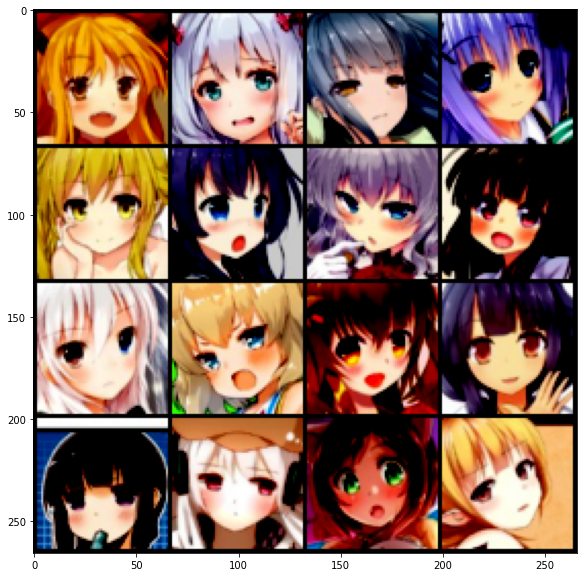

In [ ]:
dataset = get_dataset(os.path.join(workspace_dir, 'faces'))

images = [dataset[i] for i in range(16)]
grid_img = torchvision.utils.make_grid(images, nrow=4)
plt.figure(figsize=(10,10))
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

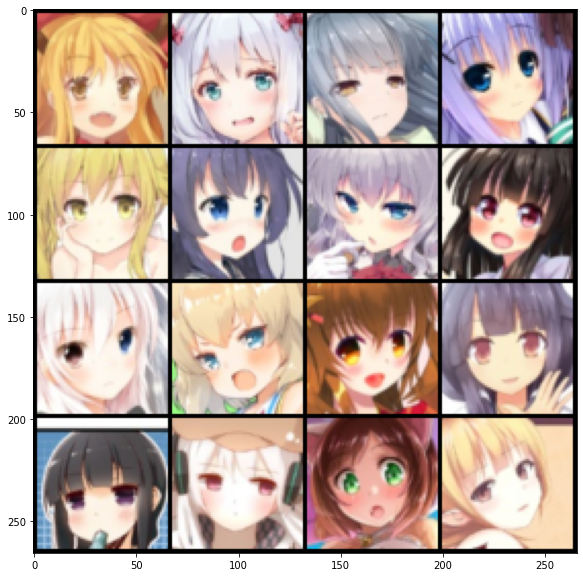

In [ ]:
images = [(dataset[i]+1)/2 for i in range(16)]
grid_img = torchvision.utils.make_grid(images, nrow=4)
plt.figure(figsize=(10,10))
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

## Model
Here, we use DCGAN as the model structure. Feel free to modify your own model structure.

Note that the `N` of the input/output shape stands for the batch size.

In [ ]:
from torch.nn import utils
from torch.nn.utils import spectral_norm 
from torchsummary import summary


# def weights_init(m):
#     classname = m.__class__.__name__
#     if classname.find('Conv') != -1:
#         m.weight.data.normal_(0.0, 0.02)
#     elif classname.find('BatchNorm') != -1:
#         m.weight.data.normal_(1.0, 0.02)
#         m.bias.data.fill_(0)

# class Generator(nn.Module):
#     """
#     Input shape: (N, in_dim)
#     Output shape: (N, 3, 64, 64)
#     """
#     def __init__(self, in_dim, dim=64):
#         super(Generator, self).__init__()
#         def dconv_bn_relu(in_dim, out_dim):
#             return nn.Sequential(
#                 nn.ConvTranspose2d(in_dim, out_dim, 5, 2,
#                                    padding=2, output_padding=1, bias=False),
#                 nn.BatchNorm2d(out_dim),
#                 nn.ReLU()
#             )
#         self.l1 = nn.Sequential(
#             nn.Linear(in_dim, dim * 8 * 4 * 4, bias=False),
#             nn.BatchNorm1d(dim * 8 * 4 * 4),
#             nn.ReLU()
#         )
#         self.l2_5 = nn.Sequential(
#             dconv_bn_relu(dim * 8, dim * 4),
#             dconv_bn_relu(dim * 4, dim * 2),
#             dconv_bn_relu(dim * 2, dim),
#             nn.ConvTranspose2d(dim, 3, 5, 2, padding=2, output_padding=1),
#             nn.Tanh()
#         )
#         self.apply(weights_init)

#     def forward(self, x):
#         y = self.l1(x)
#         y = y.view(y.size(0), -1, 4, 4)
#         y = self.l2_5(y)
#         return y

# # SNGAN
# class Discriminator(nn.Module):
#     """
#     Input shape: (N, 3, 64, 64)
#     Output shape: (N, )
#     """
#     def __init__(self, in_dim, dim=64):
#         super(Discriminator, self).__init__()

#         def conv_bn_lrelu(in_dim, out_dim):
#             return nn.Sequential(
#                 spectral_norm(nn.Conv2d(in_dim, out_dim, 5, 2, 2)),
#                 # nn.BatchNorm2d(out_dim),
#                 nn.LeakyReLU(0.2),
#             )
            
#         """ Medium: Remove the last sigmoid layer for WGAN. """
#         self.ls = nn.Sequential(
#             spectral_norm(nn.Conv2d(in_dim, dim, 5, 2, 2)), 
#             nn.LeakyReLU(0.2),
#             conv_bn_lrelu(dim, dim * 2),
#             conv_bn_lrelu(dim * 2, dim * 4),
#             conv_bn_lrelu(dim * 4, dim * 8),
#             spectral_norm(nn.Conv2d(dim * 8, 1, 4)),
#             nn.Sigmoid(), 
#         )
#         self.apply(weights_init)
        
#     def forward(self, x):
#         y = self.ls(x)
#         y = y.view(-1)
#         return y

# WGAN
# class Discriminator(nn.Module):
#     """
#     Input shape: (N, 3, 64, 64)
#     Output shape: (N, )
#     """
#     def __init__(self, in_dim, dim=64):
#         super(Discriminator, self).__init__()

#         def conv_bn_lrelu(in_dim, out_dim):
#             return nn.Sequential(
#                 nn.Conv2d(in_dim, out_dim, 5, 2, 2),
#                 nn.BatchNorm2d(out_dim),
#                 nn.LeakyReLU(0.2),
#             )
            
#         """ Medium: Remove the last sigmoid layer for WGAN. """
#         self.ls = nn.Sequential(
#             nn.Conv2d(in_dim, dim, 5, 2, 2), 
#             nn.LeakyReLU(0.2),
#             conv_bn_lrelu(dim, dim * 2),
#             conv_bn_lrelu(dim * 2, dim * 4),
#             conv_bn_lrelu(dim * 4, dim * 8),
#             nn.Conv2d(dim * 8, 1, 4),
#             # nn.Sigmoid(), 
#         )
#         self.apply(weights_init)
        
#     def forward(self, x):
#         y = self.ls(x)
#         y = y.view(-1)
#         return y

###Here, we download and use styleGAN2 as the model structure.

In [ ]:
# Download StyleGAN2 model from https://github.com/lucidrains/stylegan2-pytorch (reference [1])

!pip install stylegan2_pytorch

     |████████████████████████████████| 276kB 39.6MB/s 
     |████████████████████████████████| 81kB 12.5MB/s 
     |████████████████████████████████| 92kB 14.3MB/s 
     |████████████████████████████████| 71kB 11.4MB/s 
     |████████████████████████████████| 51kB 8.6MB/s 
     |████████████████████████████████| 61kB 10.5MB/s 
     |████████████████████████████████| 296kB 44.3MB/s 
     |████████████████████████████████| 174kB 52.6MB/s 
     |████████████████████████████████| 153kB 54.0MB/s 
     |████████████████████████████████| 71kB 11.7MB/s 
     |████████████████████████████████| 71kB 11.6MB/s 
  Created wheel for vector-quantize-pytorch: filename=vector_quantize_pytorch-0.1.0-cp37-none-any.whl size=2576 sha256=67d7eb99524bd15dc6a3a86efef24725f6fc1048ef926749abba0a989ddd5944
  Stored in directory: /root/.cache/pip/wheels/10/68/a9/2eb0d1f485a2babf71ac5e471c9d45703cf2a2cc8686f780d2
  Created wheel for fire: filename=fire-0.4.0-py2.py3-none-any.whl size=115928 sha256=e730768ff183299

## Training

### Initialization
- hyperparameters
- model
- optimizer
- dataloader

In [ ]:
# # Training hyperparameters
# batch_size = 64
# z_dim = 100
# z_sample = Variable(torch.randn(100, z_dim)).cuda()
# lr = 1e-4

# """ Medium: WGAN, 50 epoch, n_critic=5, clip_value=0.01 """
# n_epoch = 50 # 1
# n_critic = 5 # 1
# clip_value = 0.01

# savespace_dir = "/content/drive/MyDrive/MLhw6"

# log_dir = os.path.join(savespace_dir, 'logs')
# ckpt_dir = os.path.join(savespace_dir, 'checkpoints')
# os.makedirs(log_dir, exist_ok=True)
# os.makedirs(ckpt_dir, exist_ok=True)

# # Model
# G = Generator(in_dim=z_dim).cuda()
# # print(summary(G, (100, 8192)))
# print(G)
# D = Discriminator(3).cuda()
# # print(summary(D, (3, 64, 64)))
# print(D)
# G.train()
# D.train()

# # Loss
# criterion = nn.BCELoss()

# """ Medium: Use RMSprop for WGAN. """
# # Optimizer
# # opt_D = torch.optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))
# # opt_G = torch.optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
# opt_D = torch.optim.RMSprop(D.parameters(), lr=lr)
# opt_G = torch.optim.RMSprop(G.parameters(), lr=lr)


# # DataLoader
# dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2)


Generator(
  (l1): Sequential(
    (0): Linear(in_features=100, out_features=8192, bias=False)
    (1): BatchNorm1d(8192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (l2_5): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (1): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (2): Sequential(
      (0): ConvTranspose2d(128, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()


### Training loop
We store some pictures regularly to monitor the current performance of the Generator, and regularly record checkpoints.

   Iters      Elapsed Time      Speed    Loss_D  Loss_G   Epoch  Step           
 1115/1115  00:02:23<00:00:00  7.75it/s  0.0352  11.9568    1    1115           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 | Save some samples to /content/drive/MyDrive/MLhw6/logs/Epoch_001.jpg.


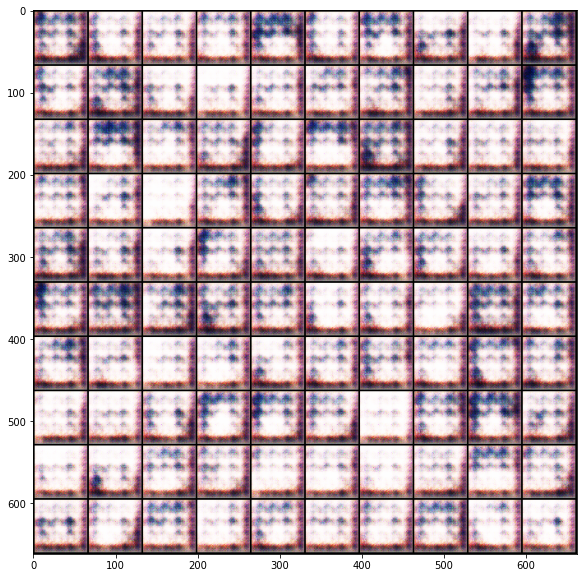

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:02:32<00:00:00  7.29it/s  0.0189  9.7436    2    2230            

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 | Save some samples to /content/drive/MyDrive/MLhw6/logs/Epoch_002.jpg.


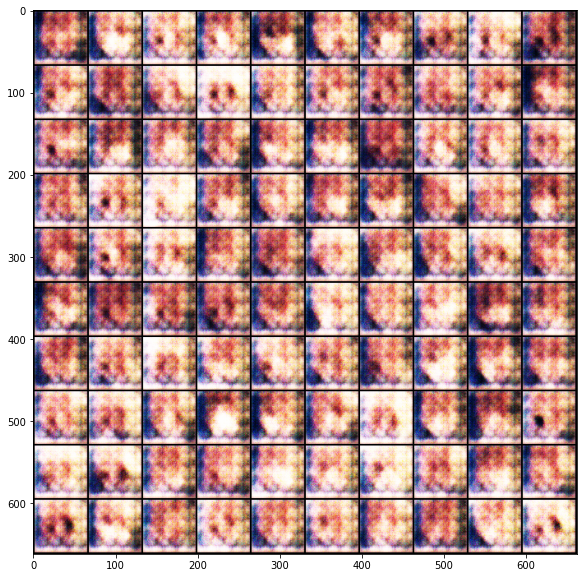

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:02:33<00:00:00  7.25it/s  0.0105  8.0795    3    3345            

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 | Save some samples to /content/drive/MyDrive/MLhw6/logs/Epoch_003.jpg.


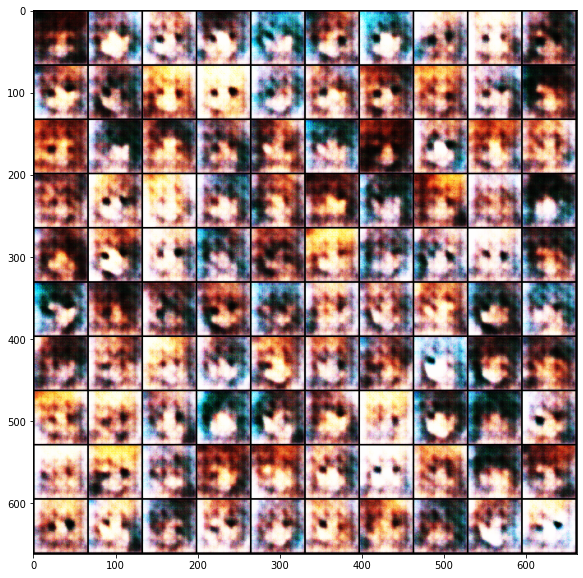

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:02:34<00:00:00  7.20it/s  0.0036  9.9669    4    4460            

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 | Save some samples to /content/drive/MyDrive/MLhw6/logs/Epoch_004.jpg.


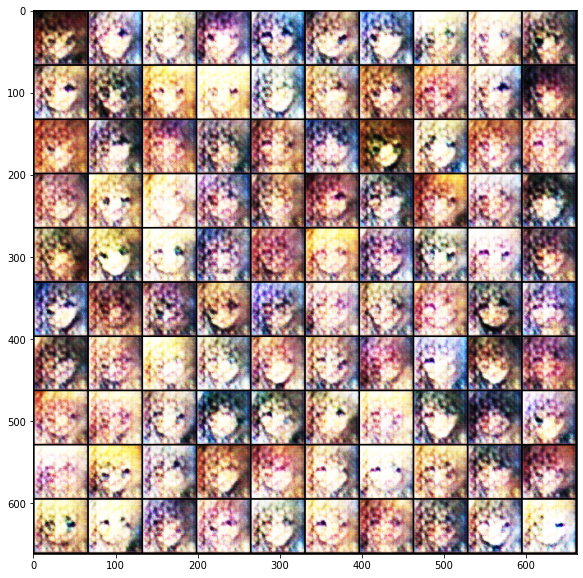

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:02:35<00:00:00  7.19it/s  0.0196  6.8307    5    5575            

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 | Save some samples to /content/drive/MyDrive/MLhw6/logs/Epoch_005.jpg.


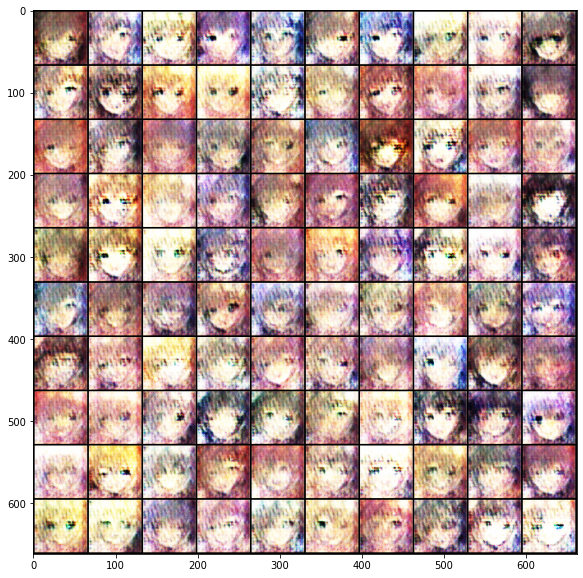

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:02:37<00:00:00  7.09it/s  0.0016  8.5967    6    6690            

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 | Save some samples to /content/drive/MyDrive/MLhw6/logs/Epoch_006.jpg.


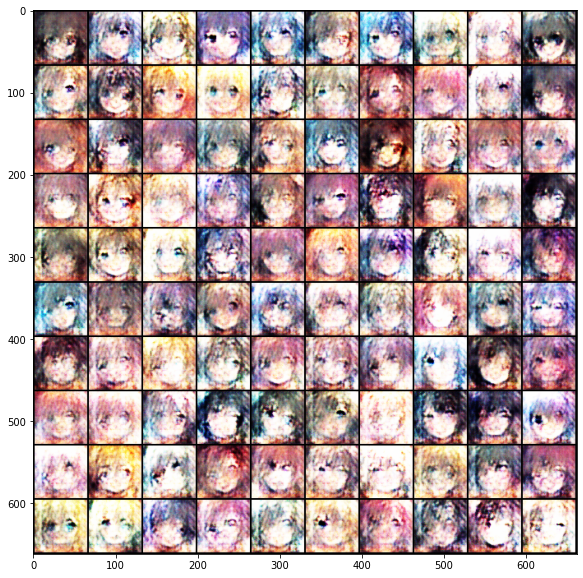

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:02:38<00:00:00  7.04it/s  0.0063  7.8158    7    7805            

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 | Save some samples to /content/drive/MyDrive/MLhw6/logs/Epoch_007.jpg.


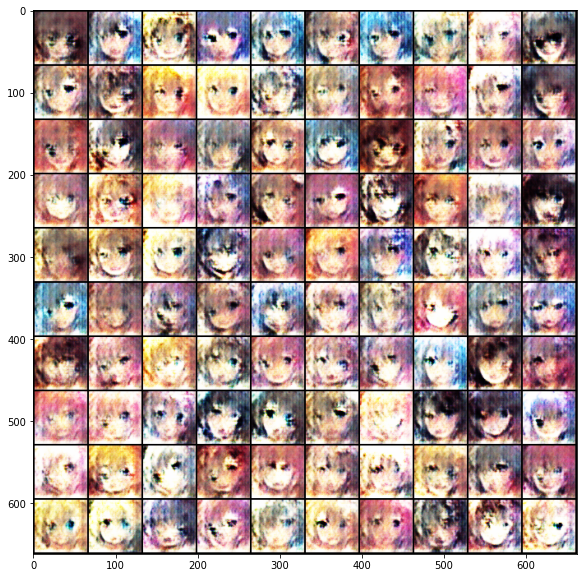

   Iters      Elapsed Time      Speed    Loss_D  Loss_G   Epoch  Step           
 1115/1115  00:02:38<00:00:00  7.03it/s  0.0028  11.0408    8    8920           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 | Save some samples to /content/drive/MyDrive/MLhw6/logs/Epoch_008.jpg.


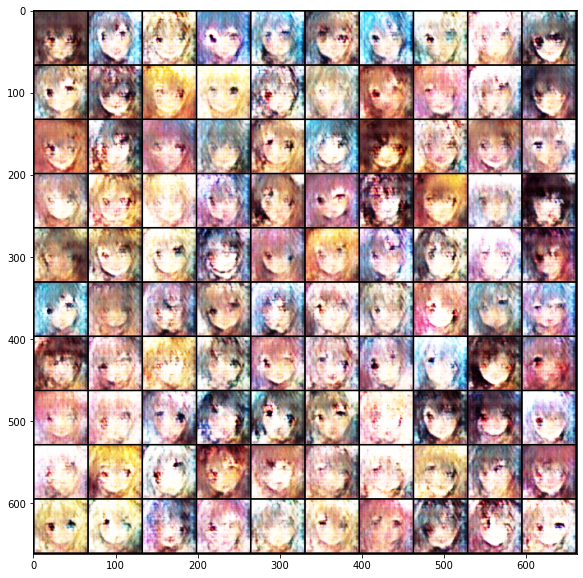

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:02:38<00:00:00  7.03it/s  0.0068  7.508     9    10035           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 | Save some samples to /content/drive/MyDrive/MLhw6/logs/Epoch_009.jpg.


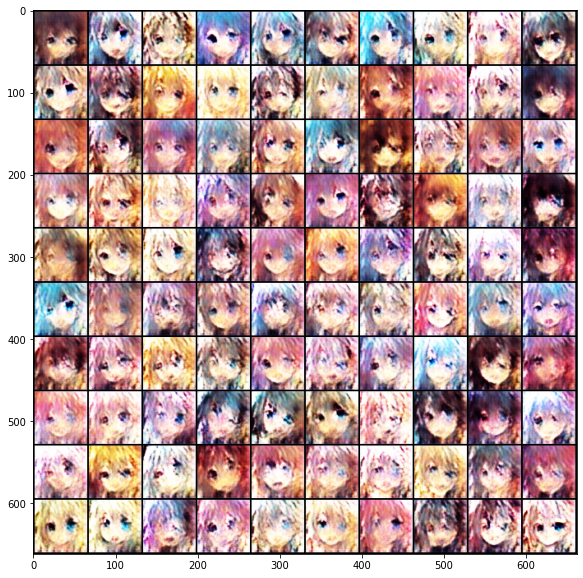

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:02:38<00:00:00  7.02it/s  0.0005  7.9443   10    11150           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 | Save some samples to /content/drive/MyDrive/MLhw6/logs/Epoch_010.jpg.


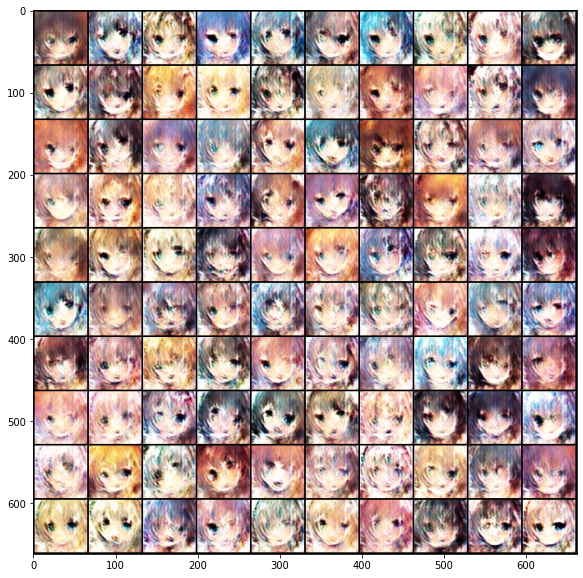

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:02:38<00:00:00  7.03it/s  0.0044  7.1918   11    12265           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 | Save some samples to /content/drive/MyDrive/MLhw6/logs/Epoch_011.jpg.


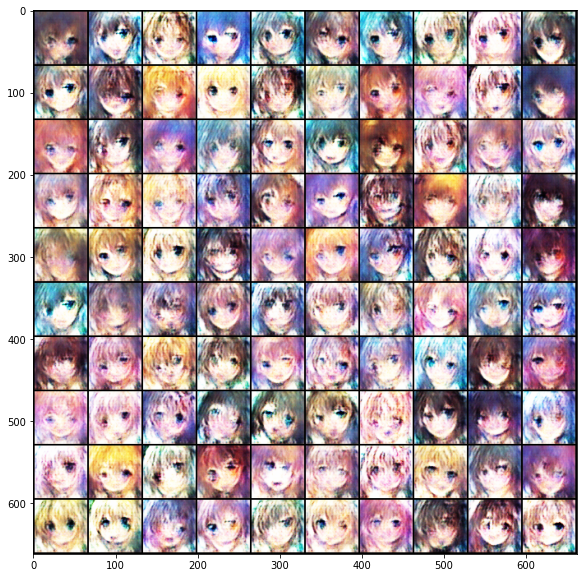

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:02:38<00:00:00  7.01it/s  0.0016  7.5355   12    13380           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 | Save some samples to /content/drive/MyDrive/MLhw6/logs/Epoch_012.jpg.


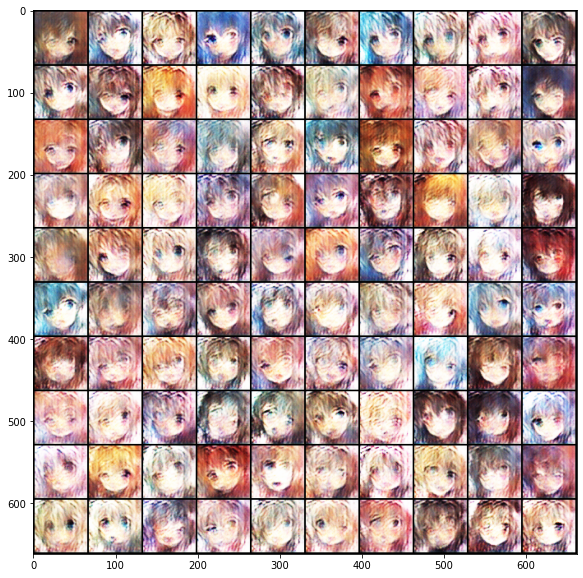

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:02:38<00:00:00  7.03it/s  0.0835  6.6167   13    14495           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 | Save some samples to /content/drive/MyDrive/MLhw6/logs/Epoch_013.jpg.


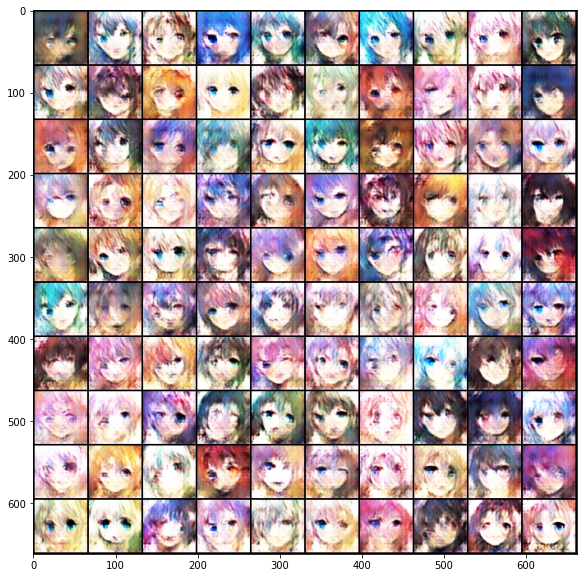

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:02:38<00:00:00  7.03it/s  0.0059  6.7908   14    15610           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 | Save some samples to /content/drive/MyDrive/MLhw6/logs/Epoch_014.jpg.


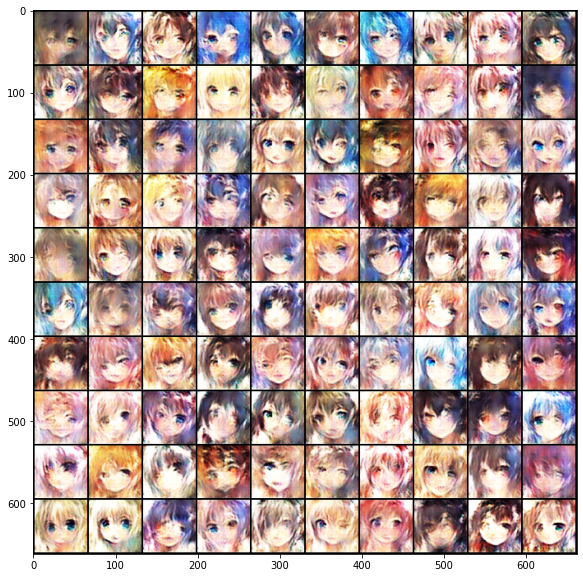

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:02:38<00:00:00  7.02it/s  0.0042  7.5611   15    16725           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 | Save some samples to /content/drive/MyDrive/MLhw6/logs/Epoch_015.jpg.


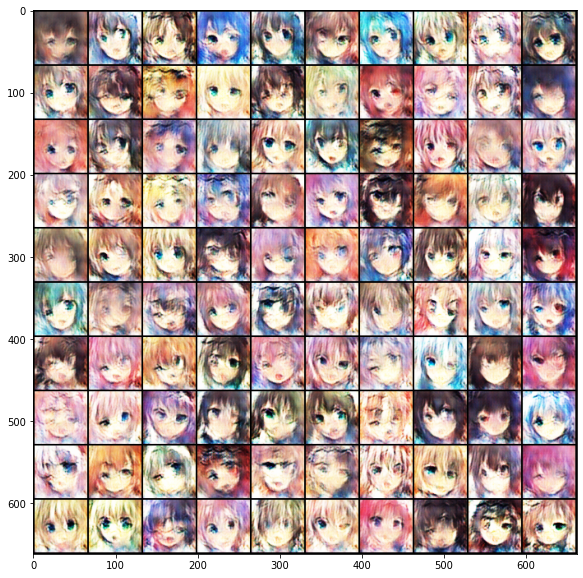

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:02:38<00:00:00  7.02it/s  0.0119  7.0924   16    17840           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 | Save some samples to /content/drive/MyDrive/MLhw6/logs/Epoch_016.jpg.


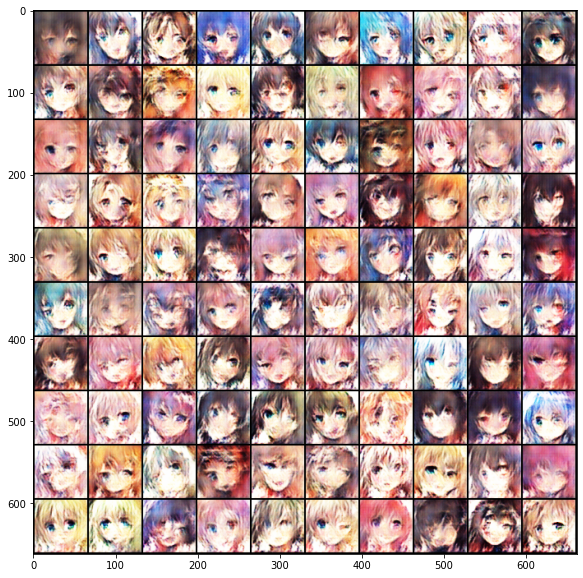

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:02:39<00:00:00  6.99it/s  0.0467  7.1229   17    18955           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 | Save some samples to /content/drive/MyDrive/MLhw6/logs/Epoch_017.jpg.


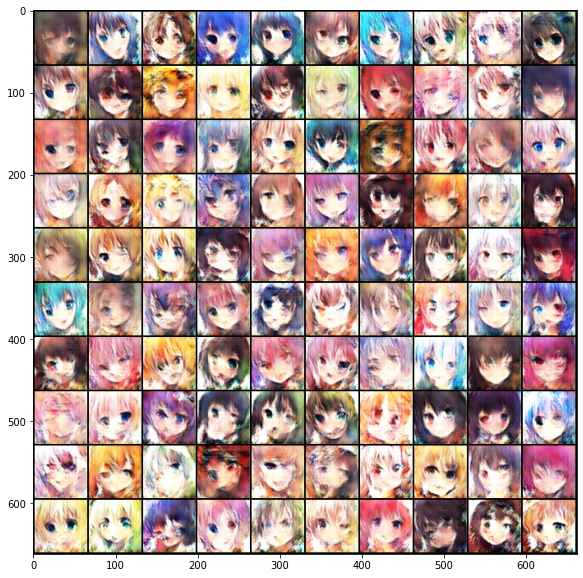

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:02:39<00:00:00  7.00it/s  0.0179  6.1639   18    20070           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 | Save some samples to /content/drive/MyDrive/MLhw6/logs/Epoch_018.jpg.


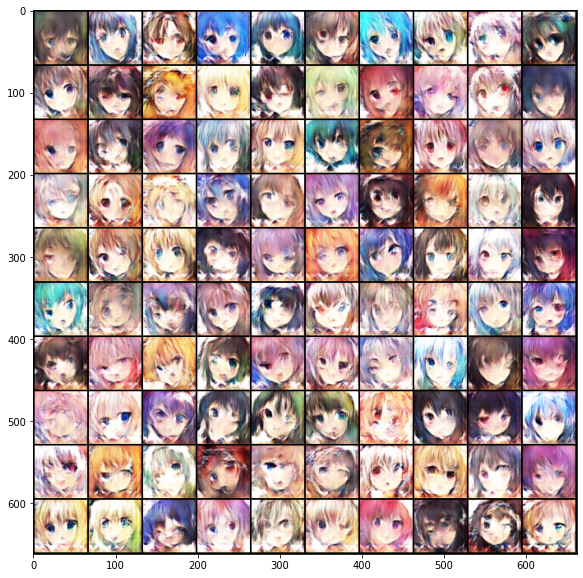

  Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step             
 708/1115  00:01:41<00:00:58  7.01it/s  0.0172  6.1356   19    20778            

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

In [ ]:
# steps = 0
# for e, epoch in enumerate(range(n_epoch)):
#     progress_bar = qqdm(dataloader)
#     for i, data in enumerate(progress_bar):
#         imgs = data
#         imgs = imgs.cuda()

#         bs = imgs.size(0)

#         # ============================================
#         #  Train D
#         # ============================================
#         z = Variable(torch.randn(bs, z_dim)).cuda()
#         r_imgs = Variable(imgs).cuda()
#         f_imgs = G(z)

#         """ Medium: Use WGAN Loss. """
#         # Label
#         r_label = torch.ones((bs)).cuda()
#         f_label = torch.zeros((bs)).cuda()

#         # Model forwarding
#         r_logit = D(r_imgs.detach())
#         f_logit = D(f_imgs.detach())
        
#         # Compute the loss for the discriminator.
#         r_loss = criterion(r_logit, r_label)
#         f_loss = criterion(f_logit, f_label)
#         loss_D = (r_loss + f_loss) / 2

#         # WGAN Loss
#         # loss_D = -torch.mean(D(r_imgs)) + torch.mean(D(f_imgs))
       

#         # Model backwarding
#         D.zero_grad()
#         loss_D.backward()

#         # Update the discriminator.
#         opt_D.step()

#         """ Medium: Clip weights of discriminator. """
#         # for p in D.parameters():
#         #    p.data.clamp_(-clip_value, clip_value)

#         # ============================================
#         #  Train G
#         # ============================================
#         if steps % n_critic == 0:
#             # Generate some fake images.
#             z = Variable(torch.randn(bs, z_dim)).cuda()
#             f_imgs = G(z)

#             # Model forwarding
#             f_logit = D(f_imgs)
            
#             """ Medium: Use WGAN Loss"""
#             # Compute the loss for the generator.
#             loss_G = criterion(f_logit, r_label)
            
#             # WGAN Loss
#             # loss_G = -torch.mean(D(f_imgs))

#             # Model backwarding
#             G.zero_grad()
#             loss_G.backward()

#             # Update the generator.
#             opt_G.step()

#         steps += 1
        
#         # Set the info of the progress bar
#         #   Note that the value of the GAN loss is not directly related to
#         #   the quality of the generated images.
#         progress_bar.set_infos({
#             'Loss_D': round(loss_D.item(), 4),
#             'Loss_G': round(loss_G.item(), 4),
#             'Epoch': e+1,
#             'Step': steps,
#         })

#     G.eval()
#     f_imgs_sample = (G(z_sample).data + 1) / 2.0
#     filename = os.path.join(log_dir, f'Epoch_{epoch+1:03d}.jpg')
#     torchvision.utils.save_image(f_imgs_sample, filename, nrow=10)
#     print(f' | Save some samples to {filename}.')
    
#     # Show generated images in the jupyter notebook.
#     grid_img = torchvision.utils.make_grid(f_imgs_sample.cpu(), nrow=10)
#     plt.figure(figsize=(10,10))
#     plt.imshow(grid_img.permute(1, 2, 0))
#     plt.show()
#     G.train()

#     if (e+1) % 5 == 0 or e == 0:
#         # Save the checkpoints.
#         torch.save(G.state_dict(), os.path.join(ckpt_dir, 'G.pth'))
#         torch.save(D.state_dict(), os.path.join(ckpt_dir, 'D.pth'))



In [ ]:
!stylegan2_pytorch ---data ./faces --image-size 64 --num-train-steps 55000 --results_dir ./drive/MyDrive/ML_hw6 --models_dir ./drive/MyDrive/StyleGAN2_checkpt

### referred from StyleGAN2 usage: https://github.com/lucidrains/stylegan2-pytorch ###

continuing from previous epoch - 50
loading from version 1.8.1
default<./faces>:  91% 50000/55000 [00:00<?, ?it/s]G: 0.00 | D: 1.51 | GP: 0.34
default<./faces>:  91% 50045/55000 [00:40<1:18:24,  1.05it/s]G: 0.46 | D: 1.35 | GP: 0.55 | PL: 0.56
default<./faces>:  91% 50093/55000 [01:37<1:28:07,  1.08s/it]G: 0.92 | D: 1.23 | GP: 0.09 | PL: 0.57
default<./faces>:  91% 50149/55000 [02:41<1:36:45,  1.20s/it]G: 0.42 | D: 1.54 | GP: 0.23 | PL: 0.57
default<./faces>:  91% 50197/55000 [03:31<1:27:17,  1.09s/it]G: 0.88 | D: 1.13 | GP: 0.64 | PL: 0.57
default<./faces>:  91% 50245/55000 [04:29<1:34:35,  1.19s/it]G: 1.00 | D: 1.52 | GP: 1.34 | PL: 0.58
default<./faces>:  91% 50293/55000 [05:19<1:26:12,  1.10s/it]G: 0.41 | D: 1.67 | GP: 0.71 | PL: 0.58
default<./faces>:  92% 50349/55000 [06:24<1:30:51,  1.17s/it]G: 0.79 | D: 1.47 | GP: 1.11 | PL: 0.58
default<./faces>:  92% 50393/55000 [07:11<1:24:24,  1.10s/it]G: 1.16 | D: 1.53 | GP: 0.24 | PL: 0.58
default<./faces>:  92% 50441/55000 [08:09<1:31:07

## Inference
Use the trained model to generate anime faces!

### Load model 

In [ ]:
# import torch

# G = Generator(z_dim)
# G.load_state_dict(torch.load(os.path.join(ckpt_dir, 'G.pth')))
# G.eval()
# G.cuda()

### Generate and show some images.


In [ ]:
!stylegan2_pytorch  --generate --load-from {50}

### referred from StyleGAN2 usage: https://github.com/lucidrains/stylegan2-pytorch ###

In [ ]:
!cp -r ./drive/MyDrive/StyleGAN2_checkpt/default/.config.json ./models/default
!cp -r ./drive/MyDrive/StyleGAN2_checkpt/default/model_55.pt ./models/default

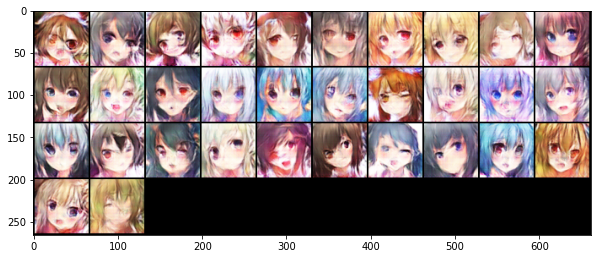

In [ ]:
# # Generate 1000 images and make a grid to save them.
# n_output = 1000
# z_sample = Variable(torch.randn(n_output, z_dim)).cuda()
# imgs_sample = (G(z_sample).data + 1) / 2.0
# log_dir = os.path.join(savespace_dir, 'logs')
# filename = os.path.join(log_dir, 'result.jpg')
# torchvision.utils.save_image(imgs_sample, filename, nrow=10)

# # Show 32 of the images.
# grid_img = torchvision.utils.make_grid(imgs_sample[:32].cpu(), nrow=10)
# plt.figure(figsize=(10,10))
# plt.imshow(grid_img.permute(1, 2, 0))
# plt.show()

### Compress the generated images using **tar**.


In [ ]:
from stylegan2_pytorch import ModelLoader

# # Save the generated images.
# os.makedirs('output', exist_ok=True)
# for i in range(1000):
#     torchvision.utils.save_image(imgs_sample[i], f'output/{i+1}.jpg')


loader = ModelLoader(
    base_dir = '.',   # path to where you invoked the command line tool
    name = 'default'                   # the project name, defaults to 'default'
)

# Save the generated images.
os.makedirs('output', exist_ok=True)
for i in range(1000):
    noise   = torch.randn(1, 512).cuda() # noise
    styles  = loader.noise_to_styles(noise, trunc_psi = 0.65)  # pass through mapping network
    images  = loader.styles_to_images(styles) # call the generator on intermediate style vectors
    torchvision.utils.save_image(images, f'output/{i+1}.jpg')


### referred from StyleGAN2 usage: https://github.com/lucidrains/stylegan2-pytorch ###

continuing from previous epoch - 55
loading from version 1.8.1


In [ ]:
# Compress the images.
%cd output
!tar -zcf ../images.tgz *.jpg
%cd ..

/content/output
/content


#Reference:

### [1] StyleGAN2 model architecture and usage: https://github.com/lucidrains/stylegan2-pytorch

